In [2]:
import numpy as np
import sklearn
import pandas as pd
import cv2
from cv2 import imread
from google.colab.patches import cv2_imshow
import os
import matplotlib.pyplot as plt
import math
from sklearn import linear_model

In [67]:
#function for averaging
# takes in image returns average for the 100x100 pixels in the middle
def average(img, channel):
  y1 = img.shape[0]//2
  y2 = y1+100

  x1 = img.shape[0]//2
  x2 = x1+100
  return np.mean(img[y1:y2, x1:x2, channel])



In [68]:
# reading in images for radiometric calibration
# computing and storing the averages
dir = '/content/drive/MyDrive/CSE264/project1/calib3/'
bgr_means = [[],[],[]]
for filename in sorted(os.listdir(dir)):
  img = imread(dir+filename)
  for i in range(3):
    bgr_means[i].append(average(img,i))

# exposure times for the images used in radiometric calibration
exp_t = [1/250, 1/160, 1/90, 1/60, 1/50, 1/45, 1/40, 1/30, 1/25, 1/20, 1/15]

In [69]:
# getting the vector of log t and reshape it in X for fitting and plotting
log_t = np.array([math.log(t) for t in exp_t])
X = log_t.reshape(-1,1)
# getting the log value of each channel
log_b = np.array([math.log(b) for b in bgr_means[0]])
log_g = np.array([math.log(g) for g in bgr_means[1]])
log_r = np.array([math.log(r) for r in bgr_means[2]])

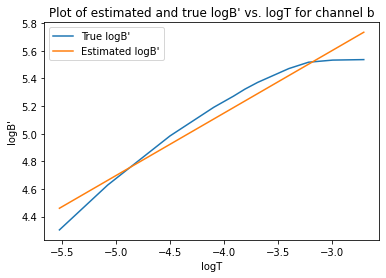

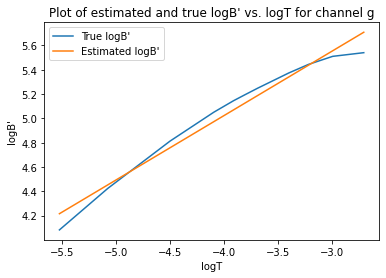

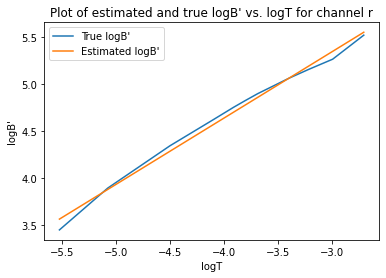

In [70]:
# estimating lambda based on log-regression and plotting
model = linear_model.LinearRegression()
bgr = [log_b, log_g, log_r]
bgr_lambdas = []
for (i,channel) in enumerate(['b', 'g', 'r']):
  Y = bgr[i]
  model.fit(X,Y)
  plt.plot(X, Y)
  plt.plot(X, model.predict(X))
  plt.legend(("True logB\'","Estimated logB\'"))
  plt.xlabel("logT")
  plt.ylabel("logB\'")
  plt.title("Plot of estimated and true logB\' vs. logT for channel {}".format(channel))
  plt.show()
  bgr_lambdas.append(1/(model.coef_))
  #print("\n")


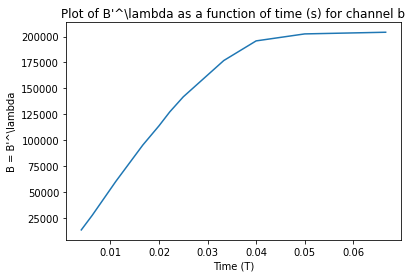

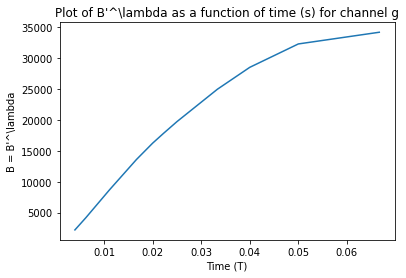

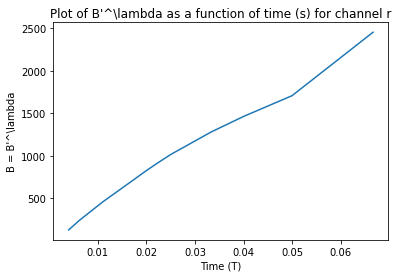

In [71]:
# plotting B'^\lambda as a function of T
X = (np.array(exp_t)).reshape(-1,1)
for (i,channel) in enumerate(['b', 'g', 'r']):
  Y = [math.pow(x,bgr_lambdas[i]) for x in bgr_means[i]]
  plt.plot(X, Y)
  plt.xlabel("Time (T)")
  plt.ylabel("B = B\'^\lambda")
  plt.title("Plot of B\'^\lambda as a function of time (s) for channel {}".format(channel))
  plt.show()
  print("\n")

In [76]:
# lambda values for BGR channels
bgr_lambdas

[array([2.2084372]), array([1.88434938]), array([1.41329172])]

##PART 2: HDR Stack

In [211]:
# reading in the three images (stack) from dir
dir = '/content/drive/MyDrive/CSE264/project1/subset2/'

stack=[]
T = [1/3200, 1/750, 1/90]
for filename in sorted(os.listdir(dir)):
  stack.append(imread((dir+filename)))

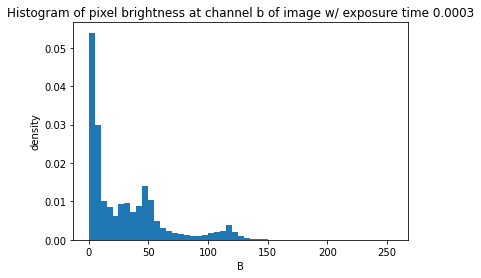

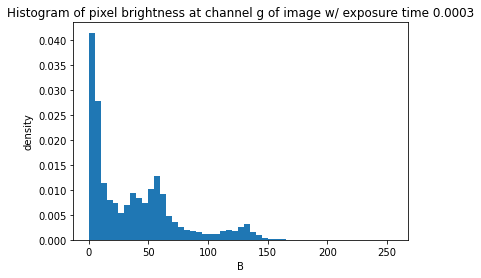

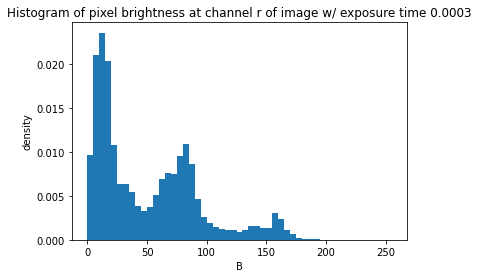

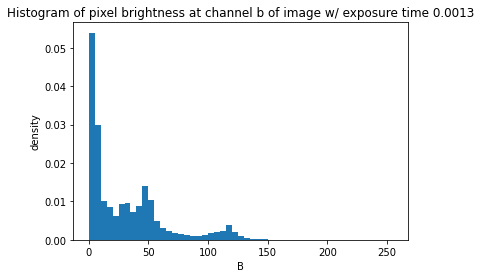

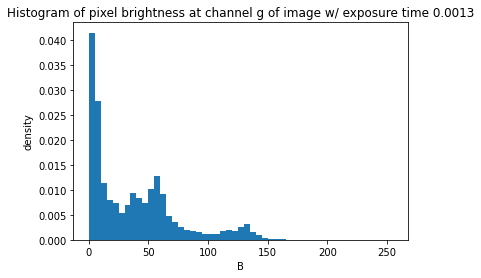

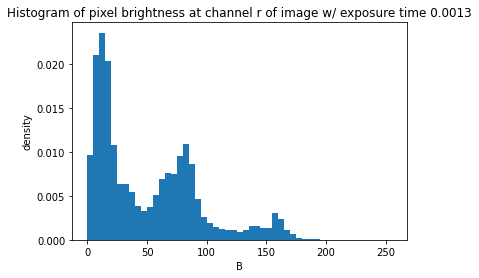

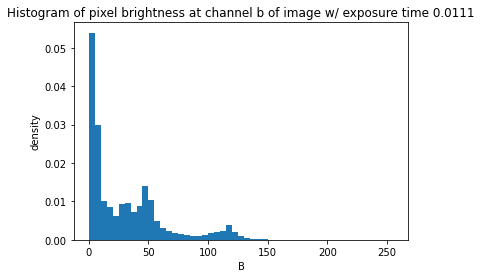

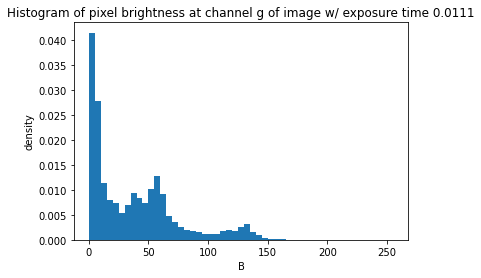

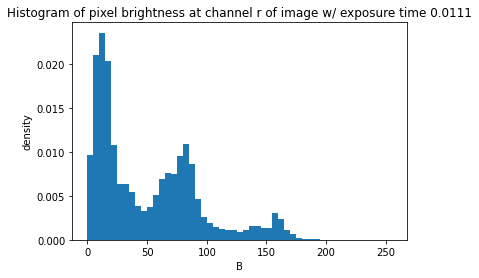

In [212]:
# plotting histograms of brightness for each channel of each image
for img_index, image in enumerate(stack):
  for i, channel in enumerate(['b', 'g', 'r']):
    x = stack[0][:,:,i]
    x = x.flatten()
    plt.hist(x, 51, (0,255), density=True)
    plt.xlabel("B")
    plt.ylabel("density")
    plt.title("Histogram of pixel brightness at channel {} of image w/ exposure time {:.4f}".format(channel, T[img_index]))
    plt.show()
    print("\n")


## PART 3: HDR Composite Image Creation

In [213]:
# lambdas for each channel
lambdas = [l[0] for l in bgr_lambdas]
lambdas

[2.2084372000612333, 1.8843493823776971, 1.4132917158106908]

In [214]:
def algo1(vals):
  candidates = []
  for item in vals:
    if item < 255:
      candidates.append(item)
  if len(candidates) == 0:
    return 254
  else:
    return max(candidates)

In [215]:
def algo2(vals):
  candidates = [val for val in vals if val < 255]
  if len(candidates) == 0:
    return 254
  else:
    return np.average(candidates)

In [216]:
# algorithm one
#initializing the compo images
compo1 = np.zeros(stack[0].shape)
compo2 = np.zeros(stack[0].shape)
dim = compo1.shape
for y in range(dim[0]):
  for x in range(dim[1]):
    for c in range(dim[2]):
      first = stack[0][y,x,c]
      second = stack[1][y,x,c]
      third = stack[2][y,x,c]
      vals = [first, second, third]
      val1 = algo1(vals)
      val2 = algo2(vals)
      compo1[y, x, c ] = math.pow(val1, lambdas[c])
      compo2[y, x, c ] = math.pow(val2, lambdas[c])



In [242]:
lin1 = compo1.copy()
lin2 = compo2.copy()


b = 1/2.2084372000612333
g = 1/1.8843493823776971
r = 1/1.4132917158106908

lin1[:,:,0] = np.power(lin1[:,:,0],b)
lin1[:,:,1] = np.power(lin1[:,:,1],g)
lin1[:,:,2] = np.power(lin1[:,:,2],r)

lin2[:,:,0] = np.power(lin2[:,:,0],b)
lin2[:,:,1] = np.power(lin2[:,:,1],g)
lin2[:,:,2] = np.power(lin2[:,:,2],r)



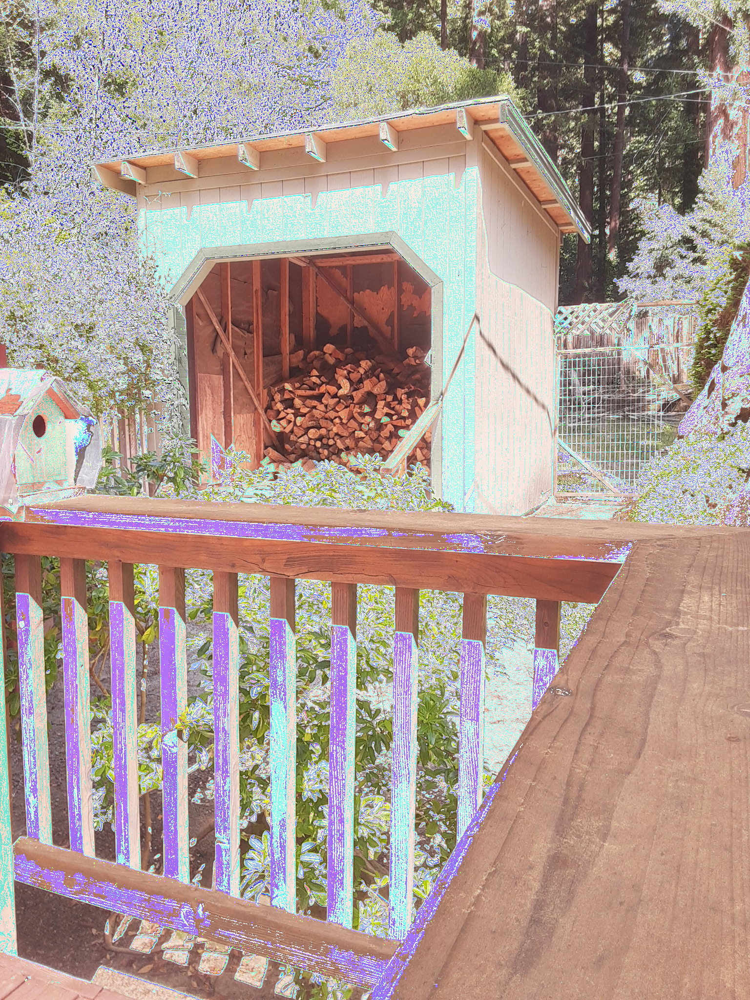

In [243]:
cv2_imshow(lin1)

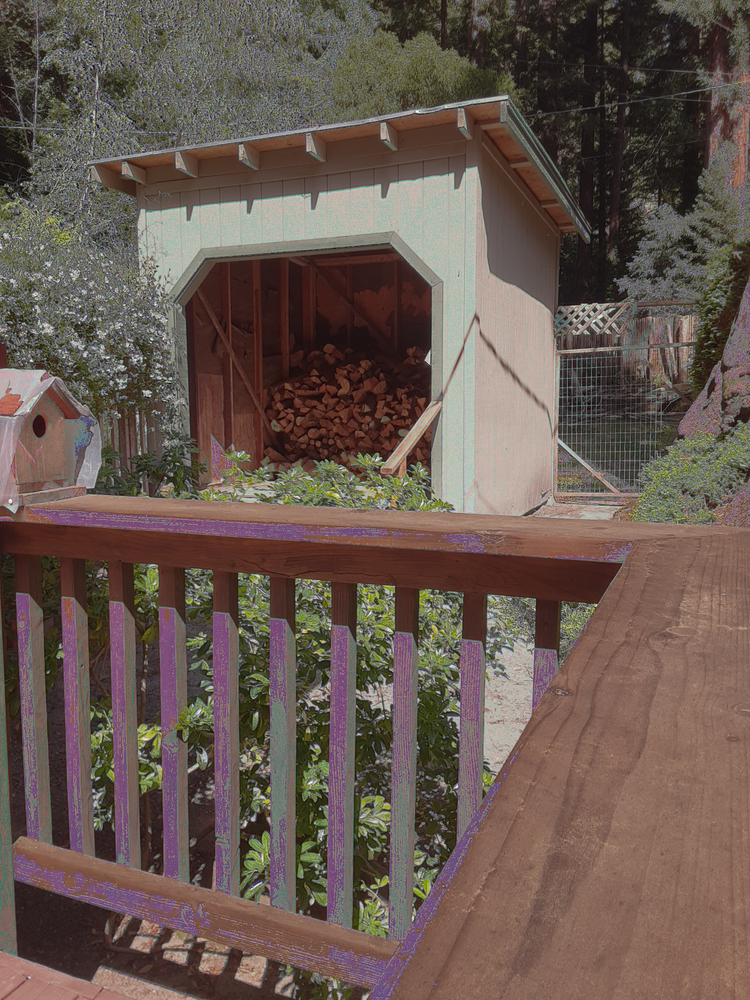

In [244]:
cv2_imshow(lin2)

In [201]:
# reading in the three images (stack) from dir
dir = '/content/drive/MyDrive/CSE264/project1/subset2/'

stack2=[]
T = [1/2000, 1/250, 1/30]
for filename in sorted(os.listdir(dir)):
  stack2.append(imread((dir+filename)))

In [241]:
fname = '/content/drive/MyDrive/CSE264/project1/hdr.png'

imt = lin2.copy()
dest = np.zeros(lin2.shape)
t = cv2.createTonemap(2.2)
dest = t.process(imt)



error: ignored

In [235]:
type(t)

cv2.Tonemap